# Final Project: Advanced Image Quilting

## CS445: Computational Photography - Spring 2022

## Jack Chen (zihengc2), 

In [1]:
# jupyter extension that allows reloading functions from imports without clearing kernel :D
%load_ext autoreload
%autoreload 2
%matplotlib inline

In [2]:
# System imports
from os import path
import math

# Third-Party Imports
import cv2
import matplotlib.pyplot as plt
import numpy as np
from scipy.interpolate import griddata
import random
import glob

# Helper Imports
from utils import *

In [3]:
# modify to where you store your project data including utils
# datadir = "/content/drive/My Drive/proj4/" 
datadir = ''

samplesfn = datadir + "samples"
# !cp -r "$samplesfn" .

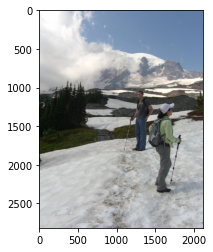

In [4]:
img = cv2.imread('samples/im2.JPG', cv2.COLOR_BGR2RGB)
width = img.shape[0]
height = img.shape[1]
Z = img.reshape((-1,3))
Z = np.float32(Z)  # convert to np.float32
plt.imshow(img[:, :, [2, 1, 0]])

(2816, 2112)
(3, 3)
[[200 201 201]
 [ 38  45  42]
 [159 144 131]]


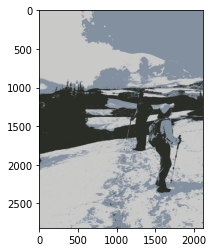

In [5]:
# define criteria, number of clusters(K) and apply kmeans()
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 10, 1.0)
K = 3
ret, label, center = cv2.kmeans(Z,K,None,criteria,10,cv2.KMEANS_RANDOM_CENTERS)
label = label.flatten()
# Now convert back into uint8, and make original image
center = np.uint8(center)
res = center[label.flatten()]
res2 = res.reshape((img.shape))
label.resize(width, height)

# check outputs
print(label.shape)
print(center.shape)
print(center)
plt.figure()
plt.imshow(res2[:, :, [2, 1, 0]])
plt.show()

In [6]:
def getSegement(labels, labelIndex):
    indices = np.where(labels==labelIndex, labels, -1)
    return indices

In [7]:
def getMask(input):
    mask = input.copy()
    mask[mask != -1] = 1
    mask[mask == -1] = 0
    mask3d = np.zeros((mask.shape[0], mask.shape[1], 3))
    for i in range(3):
        mask3d[:, :, i] = mask
    return mask3d

In [8]:
def blend(texture, input_im, mask):
    im = input_im.copy()
    output = mask * texture + (1-mask) * im
    return output

In [9]:
def blendAll(textures, label):
    input_im = np.zeros((width, height, 3))
    masks = []
    for i in range(3):
        layer = getSegement(label, i)
        masks.append(getMask(layer))
        output_im = blend(textures[i], input_im, masks[i])
        input_im = output_im

In [10]:
textures = np.zeros((K, width, height, 3))
blue = cv2.imread('samples/blue.jpg', cv2.COLOR_BGR2RGB)
textures[0] = blue
red = cv2.imread('samples/red.jpg', cv2.COLOR_BGR2RGB)
textures[1] = red
green = cv2.imread('samples/green.jpg', cv2.COLOR_BGR2RGB)
textures[2] = green

input_im = res2

masks = []
for i in range(3):
    layer = getSegement(label, i)
    masks.append(getMask(layer))
    output_im = blend(textures[i], input_im, masks[i])
    input_im = output_im

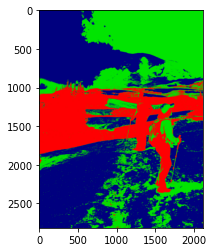

In [11]:
# change to unit8 to present original color
plt.imshow(np.uint8(input_im)[:, :, [2, 1, 0]])

In [ ]:
# out = cv2.bitwise_and(textures[0], masks[0])
# # plt.imshow(masks[0])
# plt.imshow(out)
# result[mask == 0] = textures[0] # Optional
# plt.imshow(result)

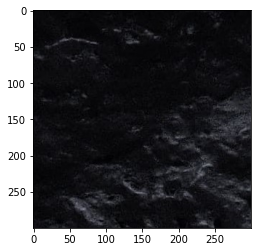

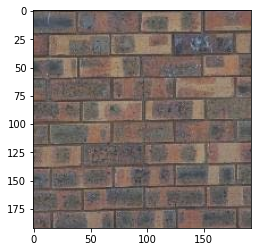

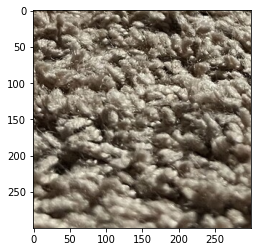

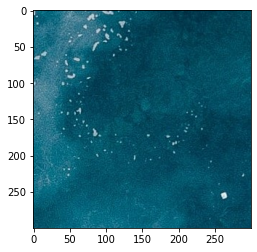

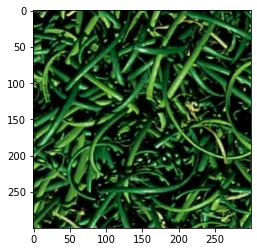

...

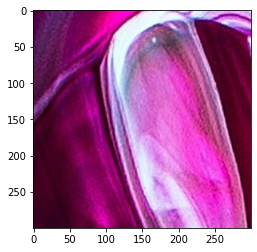

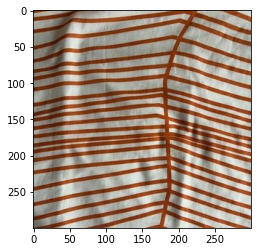

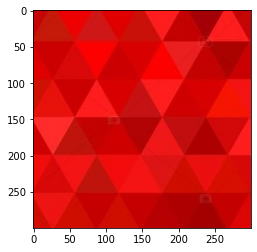

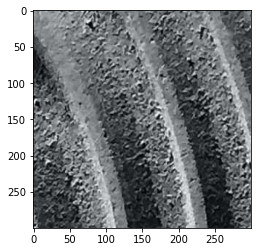

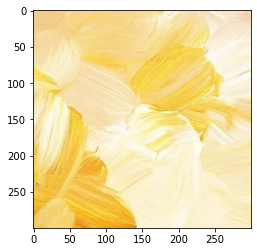

In [12]:
# Reading textures
textures = [cv2.imread(file) for file in glob.glob("textures/*.jpg")]
for texture in textures:
    plt.imshow(cv2.cvtColor(texture, cv2.COLOR_BGR2RGB))
    plt.show()

In [13]:
# Computes the average color of a texture
# https://www.delftstack.com/howto/python/opencv-average-color-of-image/
def compute_avg_color(textures):
    texture_colors = []
    for texture in textures:
        average_color_row = np.average(texture, axis=0)
        average_color = np.average(average_color_row, axis=0)
        texture_colors.append(average_color)
    return texture_colors

In [14]:
# Given a color, find the index of the texture in the texture array with closest color
# Finding the sum of the absolute difference between the red, green and blue numbers and choose the smallest one.
# https://stackoverflow.com/questions/54242194/python-find-the-closest-color-to-a-color-from-giving-list-of-colors
def color_to_texture_index(color, texture_colors):
    target_r = color[0]
    target_g = color[1]
    target_b = color[2]
    color_diffs = []
    for i in range(len(texture_colors)):
        r = texture_colors[i][2]
        g = texture_colors[i][1]
        b = texture_colors[i][0]
        color_diff = math.sqrt((r - target_r)**2 + (g - target_g)**2 + (b - target_b)**2)
        color_diffs.append((color_diff, i))
    return min(color_diffs)[1]

[200 201 201]
7


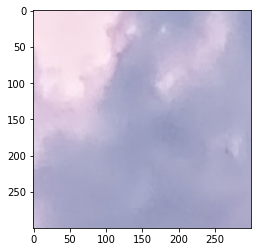

In [15]:
texture_colors = compute_avg_color(textures)
first_color = center[0]
print(first_color)
texture_index = color_to_texture_index(first_color, texture_colors)
print(texture_index)

plt.imshow(cv2.cvtColor(textures[texture_index], cv2.COLOR_BGR2RGB))

In [16]:
def patch_start(sample_size, patch_size):
        """
        Returns the position of a random pixel as patch in sample image
        :param sample_size: int         The width of the sample image
        :param patch_size: int          The width of the square sample patch
        :return: numpy.ndarray
        """
        patch_num = random.randint(0, (int(sample_size/patch_size)**2)-1)
        x_num = int(patch_num%int(sample_size/patch_size))
        y_num = int(patch_num/int(sample_size/patch_size))
        return x_num*patch_size, y_num*patch_size

In [17]:
def ssd_patch(target, mask, sample, patch_size):
    sample_R, sample_G ,sample_B = cv2.split(sample/225)
    template_R, template_G, template_B = cv2.split(target/225)
       
    result_R = np.zeros(sample.shape[0:2]);
    result_G = np.copy(result_R);
    result_B = np.copy(result_R);
    
    # Equations provided in doc
    result_R = ((mask*template_R)**2).sum() - 2 * cv2.filter2D(sample_R, ddepth=-1, kernel = mask*template_R) + cv2.filter2D(sample_R ** 2, ddepth=-1, kernel=mask)
    result_G = ((mask*template_G)**2).sum() - 2 * cv2.filter2D(sample_G, ddepth=-1, kernel = mask*template_G) + cv2.filter2D(sample_G ** 2, ddepth=-1, kernel=mask)
    result_B = ((mask*template_B)**2).sum() - 2 * cv2.filter2D(sample_B, ddepth=-1, kernel = mask*template_B) + cv2.filter2D(sample_B ** 2, ddepth=-1, kernel=mask)
    return result_R + result_G + result_B

In [18]:
def choose_sample(ssd, tol, patch_size):
    min_table = np.zeros((tol, 3))
    min_table[:, 0] = float('inf')
    min_table[:, 1] = 0
    min_table[:, 2] = 0
    center = patch_size // 2
    
    for i in range(center, ssd.shape[0]-center):
        for j in range(center, ssd.shape[1]-center):
            min_value = np.amax(min_table[:, 0])
            min_index = np.argmax(min_table[:, 0])
            if ssd[i, j] == 0:
                continue;
            if ssd[i, j] < min_value:
                min_table[min_index, 0] = ssd[i, j]
                min_table[min_index, 1] = i
                min_table[min_index, 2] = j
    ind = random.randint(0, tol-1)

    return int(min_table[ind, 1] - center), int(min_table[ind, 2] - center)

In [19]:
def quilt_cut(sample, out_size, patch_size, overlap, tol):
    """
    Samples square patches of size patchsize from sample using seam finding in order to create an output image of size outsize.
    Feel free to add function parameters
    :param sample: numpy.ndarray
    :param out_size: int
    :param patch_size: int
    :param overlap: int
    :param tol: float
    :return: numpy.ndarray
    """
    overlap_printed = False
    SSD_printed = False
    hori_mask_printed = False
    vert_mask_printed = False
    comb_mask_printed = False
    
    image = np.zeros((out_size,out_size,3))
    
    x_init, y_init = patch_start(sample.shape[0], patch_size)
    image[0:patch_size,0:patch_size :] = sample[x_init:x_init+patch_size, y_init:y_init+patch_size, :]
    
    mask_top = np.zeros((patch_size, patch_size))
    mask_left = np.copy(mask_top)
    mask_top_left = np.copy(mask_top)
    mask_top[0:overlap, :] = 1
    mask_left[:, 0:overlap] = 1
    mask_top_left[:, 0:overlap] = 1    
    mask_top_left[0:overlap, :] = 1 
    
    i = 0
    j = patch_size - overlap
    diff = j
    
    while i + patch_size <= out_size:
        print(i)
        while j + patch_size <= out_size:
            mask = None
            if i >= diff and j >= diff:
                mask = mask_top_left
            elif j >= diff:
                mask = mask_left
            elif i >= diff:
                mask = mask_top
                
            cut_left_mask = np.zeros((patch_size,patch_size, 3))
            cut_top_mask = np.copy(cut_left_mask)
            cut_final_mask = np.copy(cut_left_mask)

            template = image[i:i+patch_size,j:j+patch_size]
            ssd = ssd_patch(template, mask, sample, patch_size)
            x, y = choose_sample(ssd, tol, patch_size)
            min_patch = sample[x:x+patch_size, y:y+patch_size, :]
            
            bnd_cost = 0.0
            for channel in range(template.shape[2]):
                bnd_cost += (min_patch[:, :, channel] - template[:, :, channel])**2 
            
            if i >= diff and j >= diff:
                cut_left_mask[:, :, 0] = cut(bnd_cost.T).T
                cut_left_mask[:, :, 1] = cut_left_mask[:, :, 0]
                cut_left_mask[:, :, 2] = cut_left_mask[:, :, 0]
                cut_top_mask[:, :, 0] = cut(bnd_cost)
                cut_top_mask[:, :, 1] = cut_top_mask[:, :, 0]
                cut_top_mask[:, :, 2] = cut_top_mask[:, :, 0]
                cut_final_mask = np.logical_and(cut_left_mask, cut_top_mask)
                if not comb_mask_printed:
                    plt.figure("Combined Mask")
                    plt.imshow(cut_final_mask.astype(np.float64))
                    plt.title("Combined Mask")
                    plt.show()
                    comb_mask_printed = True
            
            elif j >= diff:
                cut_final_mask[:, :, 0] = cut(bnd_cost.T).T
                cut_final_mask[:, :, 1] = cut_final_mask[:, :, 0]
                cut_final_mask[:, :, 2] = cut_final_mask[:, :, 0]
                if not vert_mask_printed:
                    plt.figure("Vertical Mask")
                    plt.imshow(cut_final_mask)
                    plt.title("Vertical Mask")
                    plt.show()
                    vert_mask_printed = True
            
            elif i >= diff:
                cut_final_mask[:, :, 0] = cut(bnd_cost)
                cut_final_mask[:, :, 1] = cut_final_mask[:, :, 0]
                cut_final_mask[:, :, 2] = cut_final_mask[:, :, 0]
                if not hori_mask_printed :
                    plt.figure("Horizontal Mask")
                    plt.imshow(cut_final_mask)
                    plt.title("Horizontal Mask")
                    plt.show()
                    hori_mask_printed = True
            
            if not overlap_printed:
                plt.figure("Overlapping Portion")
                plt.imshow(template/255)
                plt.title("Overlapping Portion")
                plt.show()
                overlap_printed = True
            
            if not SSD_printed:
                plt.figure("Pixelwise SSD Cost")
                plt.imshow(ssd)
                plt.title("Pixelwise SSD Cost")
                plt.show()
                SSD_printed = True
                
            image[i:i+patch_size, j:j+patch_size, :] = sample[x:x+patch_size, y:y+patch_size, :]
            j += diff
        j = 0
        i += diff
        
    return image/255

0


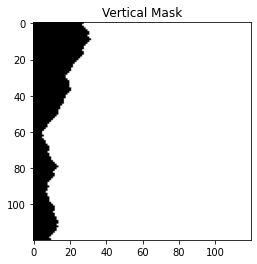

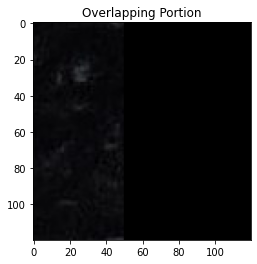

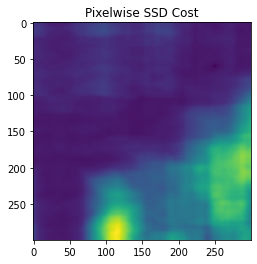

70


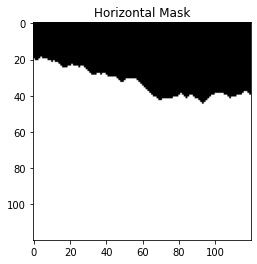

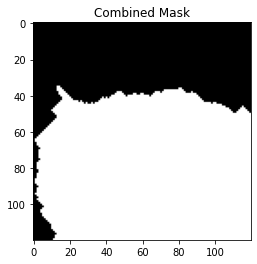

140
210
280
350
420
490
560
630
700
770
840
910
980
1050
1120
1190
1260
1330
1400
1470
1540
1610
1680
1750
1820
1890
1960
2030
2100
2170
2240
2310
2380
2450
2520
2590
2660
0


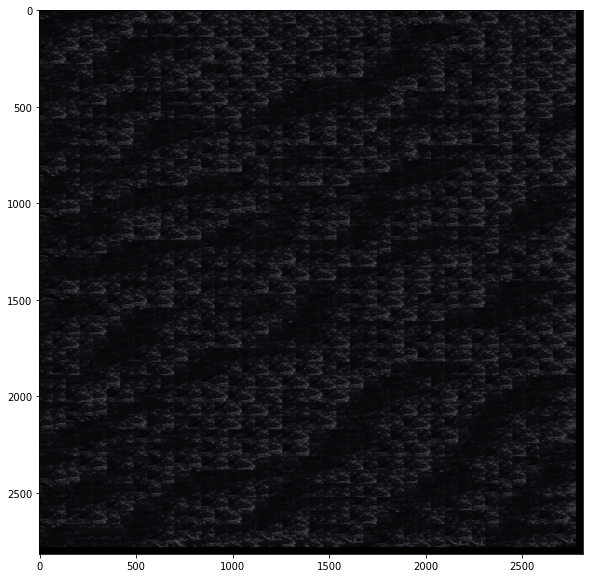

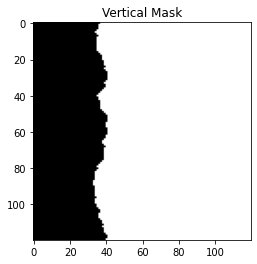

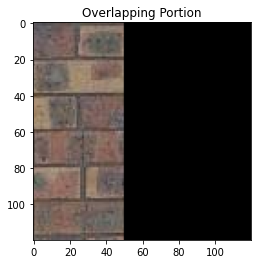

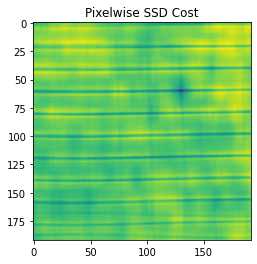

70


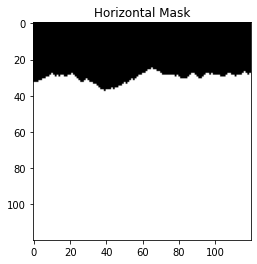

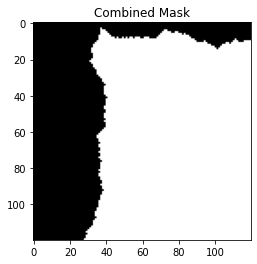

140
210
280
350
420
490
560
630
700
770
840
910
980
1050
1120
1190
1260
1330
1400
1470
1540
1610
1680
1750
1820
1890
1960
2030
2100
2170
2240
2310
2380
2450
2520
2590
2660
0


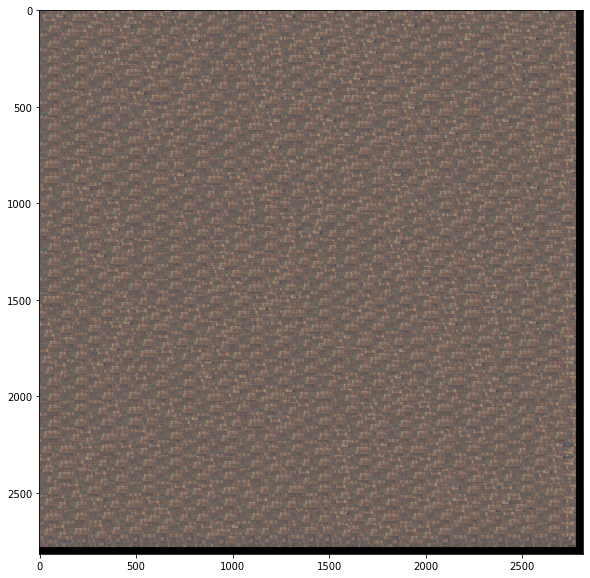

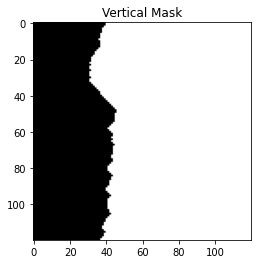

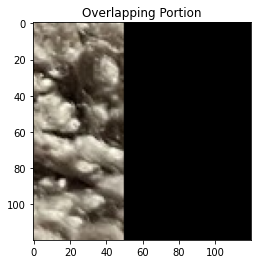

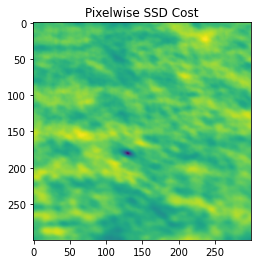

70


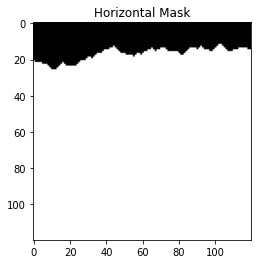

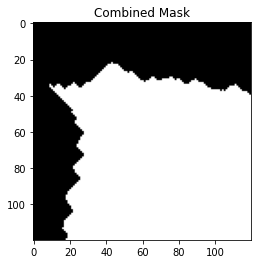

140
210
280
350
420
490
560
630
700
770
840
910
980
1050
1120
1190
1260
1330
1400
1470
1540
1610
1680
1750
1820
1890
1960
2030
2100
2170
2240
2310
2380
2450
2520
2590
2660
0


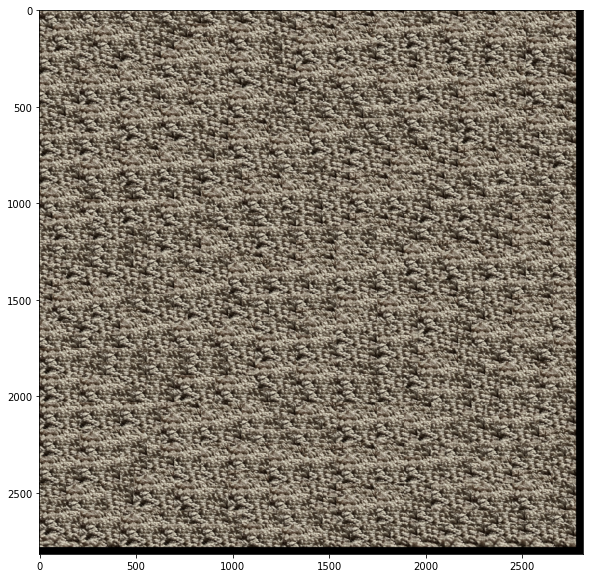

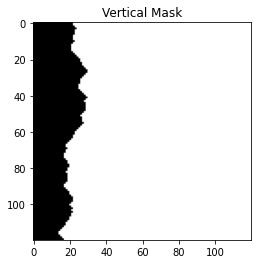

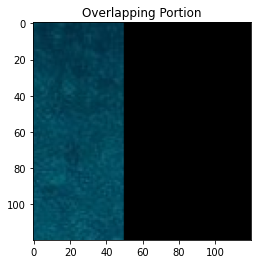

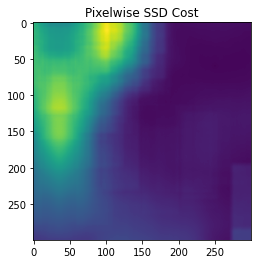

70


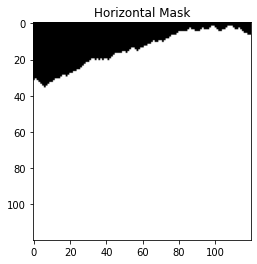

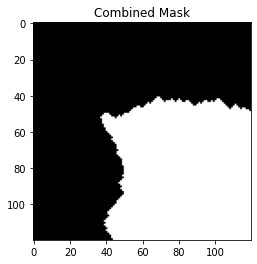

140
210
280
350
420
490
560
630
700
770
840
910
980
1050
1120
1190
1260
1330
1400
1470
1540
1610
1680
1750
1820
1890
1960
2030
2100
2170
2240
2310
2380
2450
2520
2590
2660
0


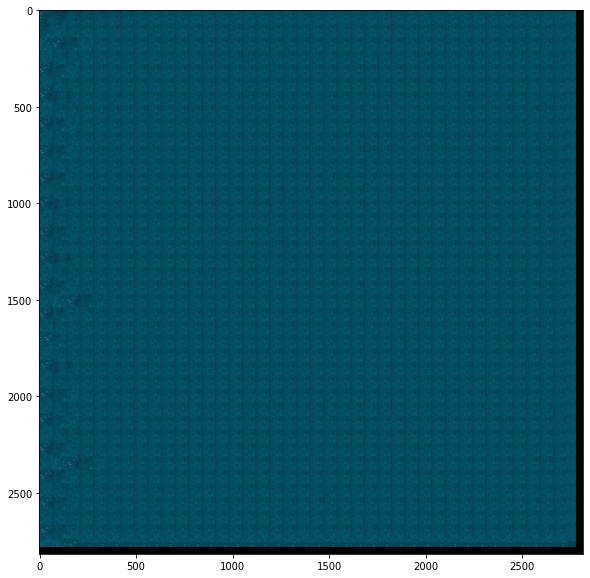

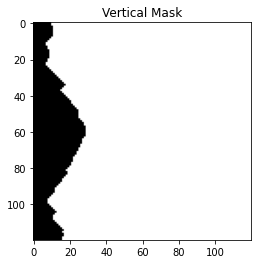

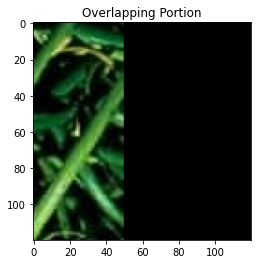

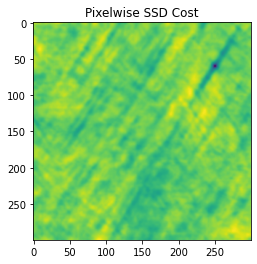

70


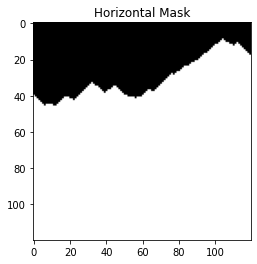

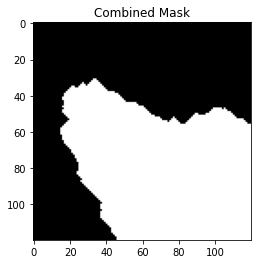

140
210
280
350
420
490
560
630
700
770
840
910
980
1050
1120
1190
1260
1330
1400
1470
1540
1610
1680
1750
1820
1890
1960
2030
2100
2170
2240
2310
2380
2450
2520
2590
2660
0


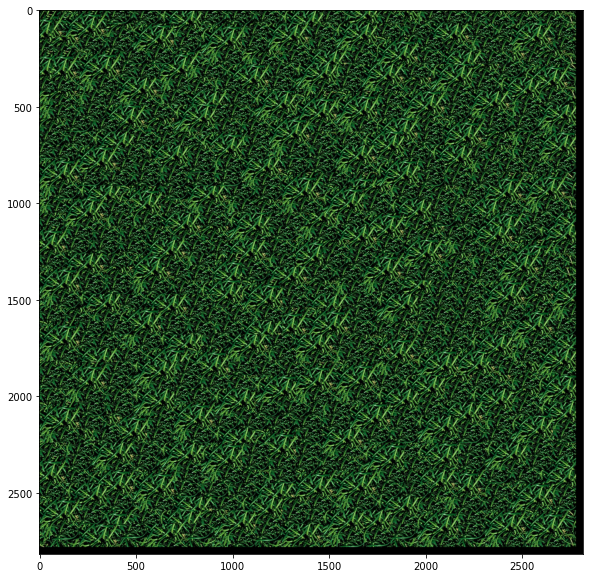

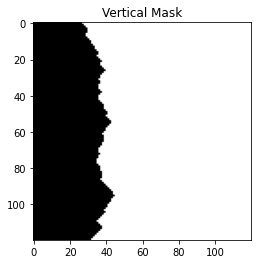

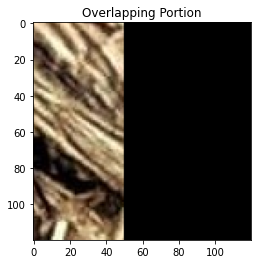

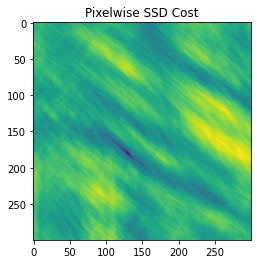

70


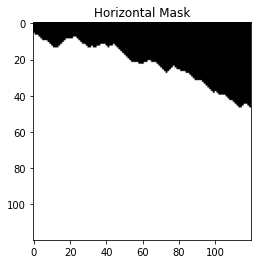

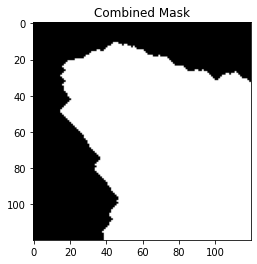

140
210
280
350
420
490
560
630
700
770
840
910
980
1050
1120
1190
1260
1330
1400
1470
1540
1610
1680
1750
1820
1890
1960
2030
2100
2170
2240
2310
2380
2450
2520
2590
2660
0


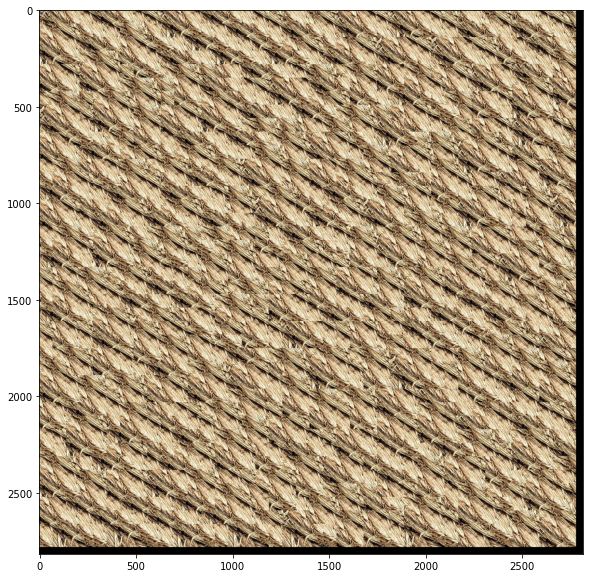

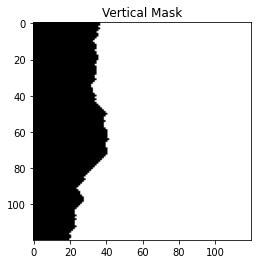

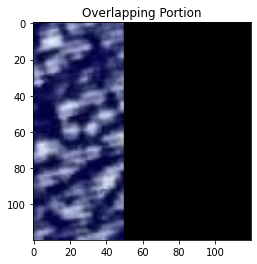

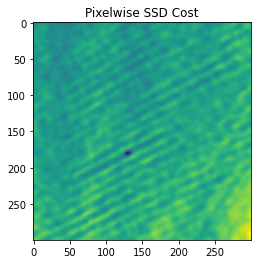

70


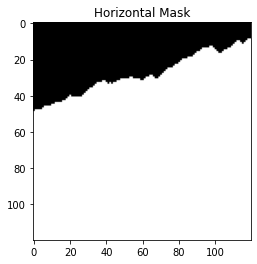

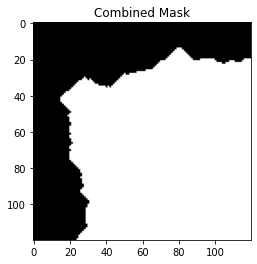

140
210
280
350
420
490
560
630
700
770
840
910
980
1050
1120
1190
1260
1330
1400
1470
1540
1610
1680
1750
1820
1890
1960
2030
2100
2170
2240
2310
2380
2450
2520
2590
2660
0


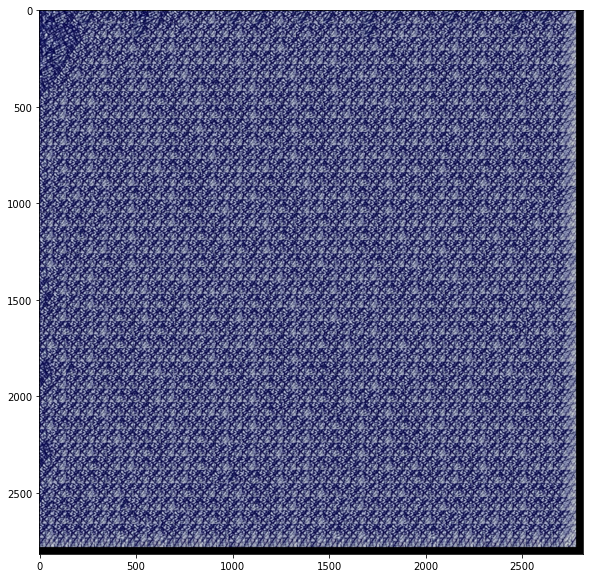

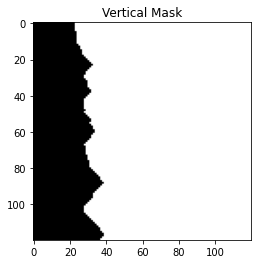

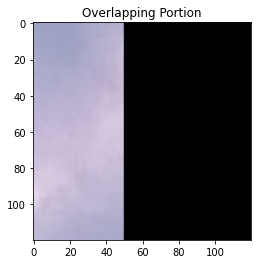

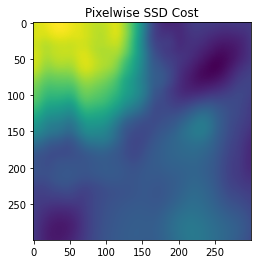

70


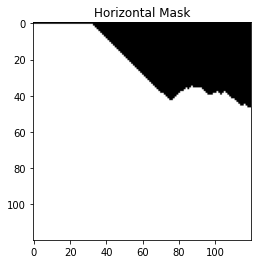

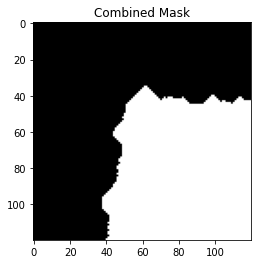

140
210
280
350
420
490
560
630
700
770
840
910
980
1050
1120
1190
1260
1330
1400
1470
1540
1610
1680
1750
1820
1890
1960
2030
2100
2170
2240
2310
2380
2450
2520
2590
2660
0


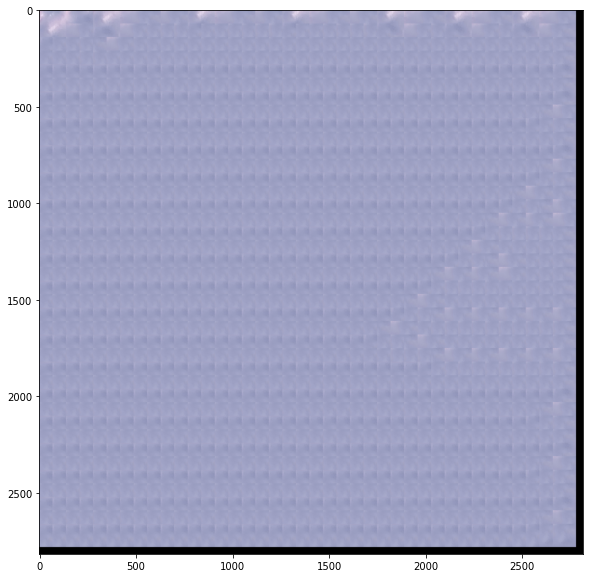

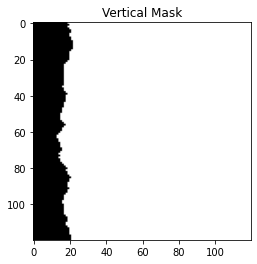

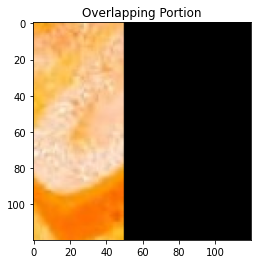

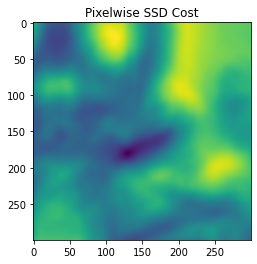

70


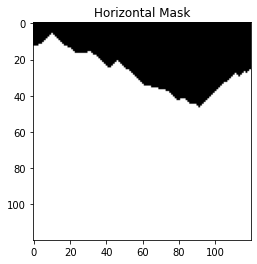

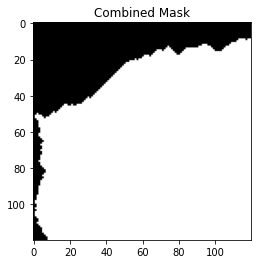

140
210
280
350
420
490
560
630
700
770
840
910
980
1050
1120
1190
1260
1330
1400
1470
1540
1610
1680
1750
1820
1890
1960
2030
2100
2170
2240
2310
2380
2450
2520
2590
2660
0


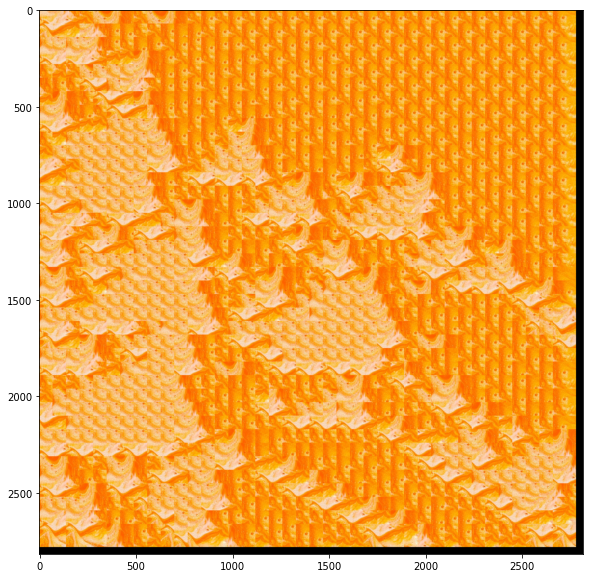

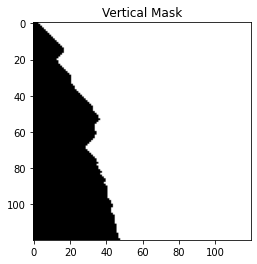

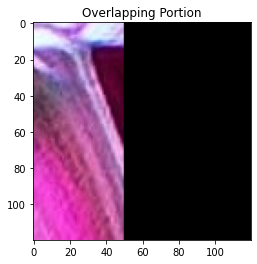

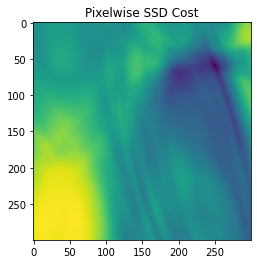

70


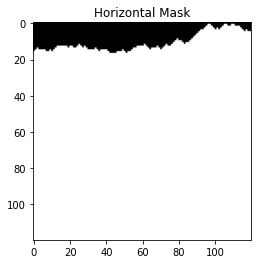

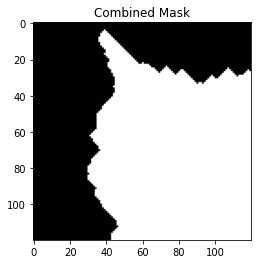

140
210
280
350
420
490
560
630
700
770
840
910
980
1050
1120
1190
1260
1330
1400
1470
1540
1610
1680
1750
1820
1890
1960
2030
2100
2170
2240
2310
2380
2450
2520
2590
2660
0


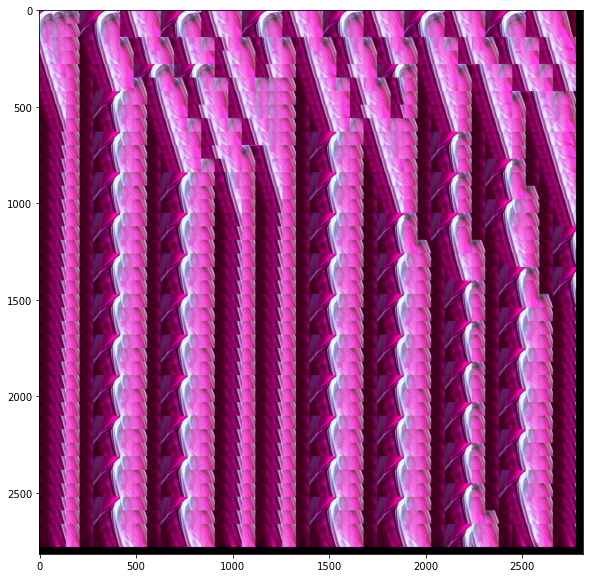

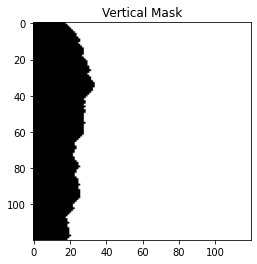

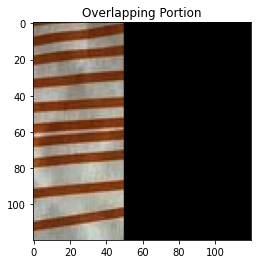

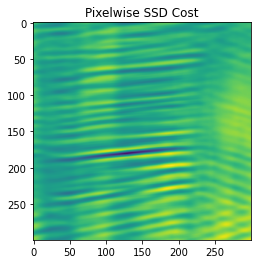

70


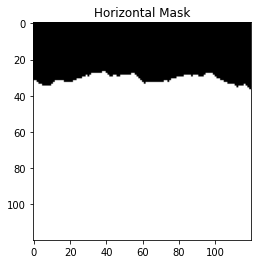

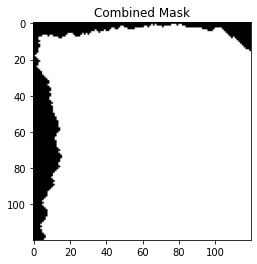

140
210
280
350
420
490
560
630
700
770
840
910
980
1050
1120
1190
1260
1330
1400
1470
1540
1610
1680
1750
1820
1890
1960
2030
2100
2170
2240
2310
2380
2450
2520
2590
2660
0


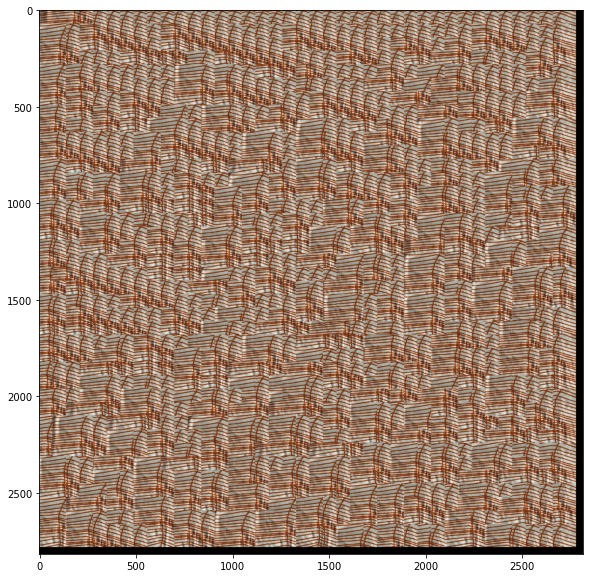

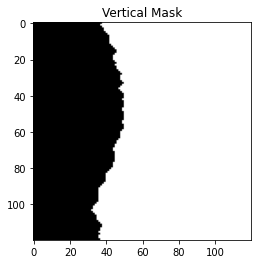

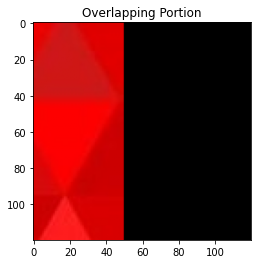

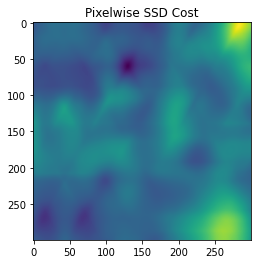

70


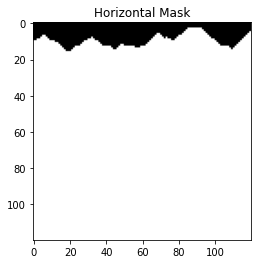

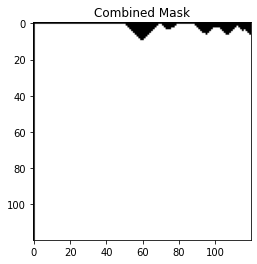

140
210
280
350
420
490
560
630
700
770
840
910
980
1050
1120
1190
1260
1330
1400
1470
1540
1610
1680
1750
1820
1890
1960
2030
2100
2170
2240
2310
2380
2450
2520
2590
2660
0


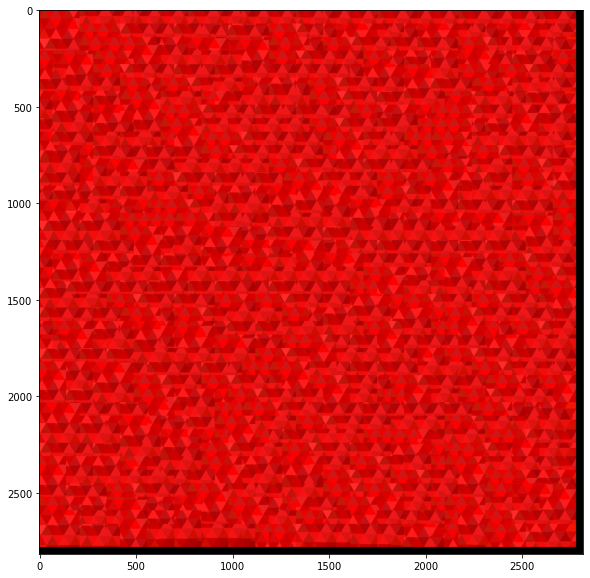

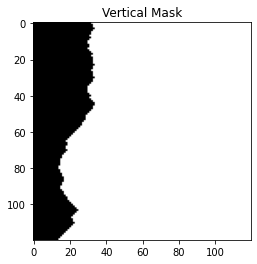

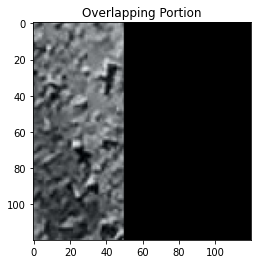

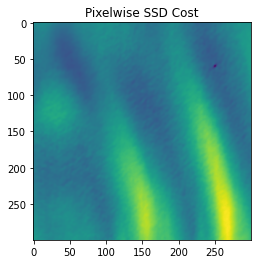

70


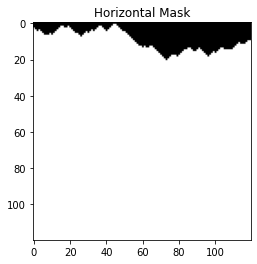

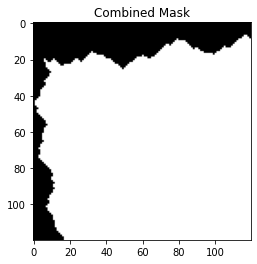

140
210
280
350
420
490
560
630
700
770
840
910
980
1050
1120
1190
1260
1330
1400
1470
1540
1610
1680
1750
1820
1890
1960
2030
2100
2170
2240
2310
2380
2450
2520
2590
2660
0


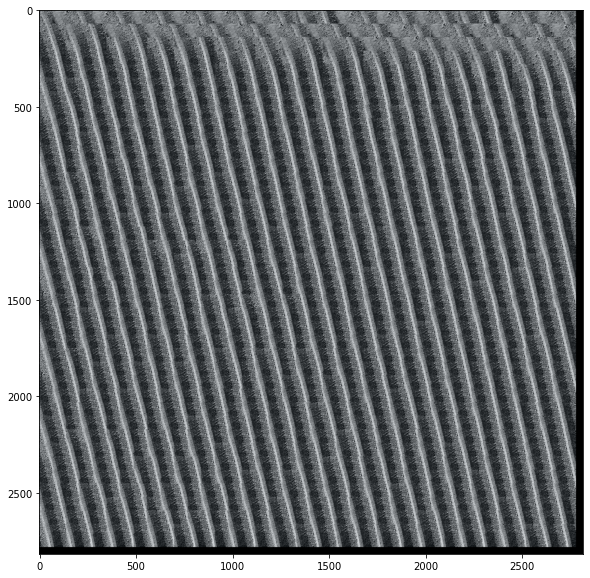

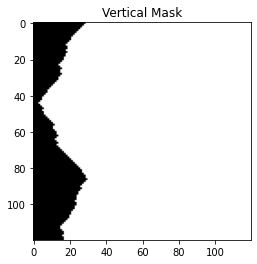

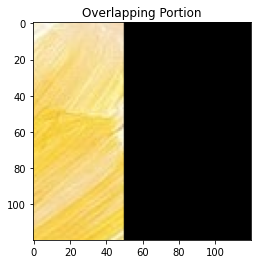

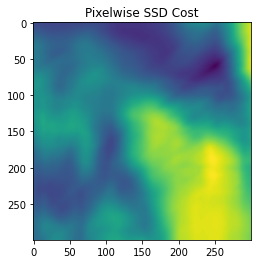

70


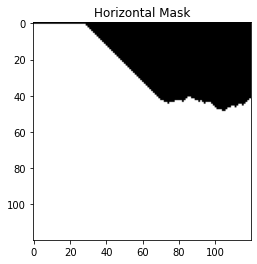

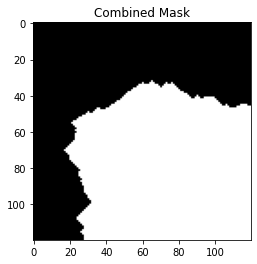

140
210
280
350
420
490
560
630
700
770
840
910
980
1050
1120
1190
1260
1330
1400
1470
1540
1610
1680
1750
1820
1890
1960
2030
2100
2170
2240
2310
2380
2450
2520
2590
2660


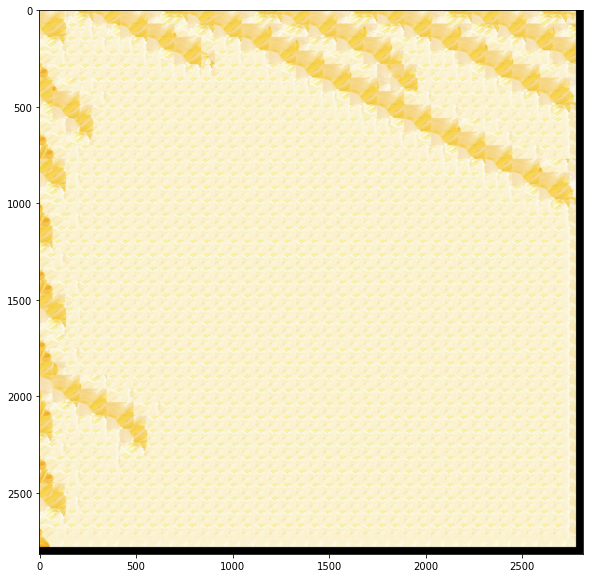

In [30]:
out_size = max(width, height)
patch_size = 120
overlap = 50
tol = 4

backgrounds = []
for i in range(len(textures)):
    curr_texture = cv2.cvtColor(textures[i], cv2.COLOR_BGR2RGB)
    res = quilt_cut(curr_texture, out_size, patch_size, overlap, tol)

    if res is not None:
        plt.figure(figsize=(10,10))
        plt.imshow(res)
        backgrounds.append(res)
        write_image(backgrounds[i], 'generated_texture/'+str(i) +'.png')

In [25]:
 plt.imshow(backgrounds[2])

IndexError: list index out of range

In [27]:
print(out_size)

2816
